In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import sys
sys.path.append('../')

from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from data.load import get_data, get_patched_data, get_patched_src, subsample
from data.utils import custom_cutout
from model.metrics import psnr, ssim
from model import losses

## Choose Devices

In [2]:
gpu_id = 3
num_cores = 8

In [3]:
torch.cuda.set_device(gpu_id)

To load the patch critic, loading data is necessary. Is there a way to load the model without loading any data (can we save a good critic not as .pth file but as something else)?

## Resnet Feature loss

### Load data for critic

In [4]:
bs = 8  # batch size
size = 256  # image size
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF')  # path to dataset
lr_dir = f'EM/training/trainsets/lr/'  # input images
hr_dir = f'EM/training/trainsets/hr/'  # target images
critic_path = data_pth/f'EM/models/critics'  # path to saved models
print(data_pth)  # confirm data path
print(critic_path) # confirm model path

random_patch = partial(custom_cutout, min_n_holes=10, max_n_holes=20,
                       min_length=15, max_length=25, use_on_y=False)

tfms = [[random_patch()], [random_patch()]]

# Create databunch
data = get_patched_data(data_pth, hr_dir, bs, tfms=tfms,
                        in_sz=size, out_sz=size)

/home/alaa/Dropbox/BPHO Staff/USF
/home/alaa/Dropbox/BPHO Staff/USF/EM/models/critics


### Load critic model

In [5]:
critic_arch = models.resnet34
wd = 1e-3
superres_metrics = [F.mse_loss, psnr, ssim]
critic = unet_learner(data, critic_arch, wd=wd, 
                         loss_func=losses.mse_loss,
                         metrics=superres_metrics, 
                         #callback_fns=LossMetrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=critic_path)
gc.collect()

0

In [6]:
critic.model_dir = critic_path
critic = critic.load('critic_patches_resnet_pretrained.2g')

### Define the feature loss class

In [7]:
encoder = critic.model.eval()[0]
layers, prev_layer_idxs = losses.grab_resnet_layers(encoder)
layers, prev_layer_idxs

([Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False),
  Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(64, 128, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(128, 256, kernel_size=(1, 1), stride=(2, 2), bias=False),
  Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
  Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)],
 [[4, -1, -1],
  [5, 0, 4, -1],
  [5, -1, -1],
  [6, 0, 4, -1],
  [6, -1, -1],
  [7, 0, 4, -1]])

## Loss Functions

In [8]:
feat_loss_obj = losses.FeatureLoss(m_feat=encoder, layer_ids=prev_layer_idxs, 
                               layer_wgts=[1/6 for _ in range(6)])

In [9]:
def combo_loss(img1, img2, w_mse=10):
    mse_loss = losses.mse_loss(img1, img2)
    feat_loss = feat_loss_obj(img1, img2)
    ssim_loss = losses.ssim_log_loss(img1, img2)
    return w_mse*mse_loss + feat_loss + ssim_loss

# Model

## Initialization

In [10]:
nb_name = 'comboloss-v2'
data_pth = Path('/home/alaa/Dropbox/BPHO Staff/USF/')
lr_path = f'EM/training/trainsets/lr/'
hr_path = f'EM/training/trainsets/hr/'
model_path = data_pth/f'EM/models/feat_loss/'

In [10]:
# loading 1st round of data
bs_1 = 64
size_1 = 128
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_1, in_sz=size_1, out_sz=size_1, max_zoom=6)

In [11]:
def mse_metric(pred, target):
    return 10*F.mse_loss(pred, target)

In [12]:
combo_metrics = [mse_metric, feat_loss_obj, losses.ssim_log_loss, psnr, ssim]
arch = models.resnet34
wd = 1e-3

In [14]:
learn = unet_learner(db, arch, wd=wd, 
                         loss_func=combo_loss,
                         metrics=combo_metrics, 
                         #callback_fns=LossMetrics, 
                         blur=False, 
                         norm_type=NormType.Weight, 
                         model_dir=model_path)
gc.collect()

0

In [15]:
learn.model_dir = model_path
print(learn.model_dir)

/home/alaa/Dropbox/BPHO Staff/USF/EM/models/feat_loss


## Load Model (optional)

In [16]:
# learn.model_dir = model_pth
# learn = learn.load(f'{nb_name}.3b')

# Load PSSR
learn = learn.load(f'{nb_name}.3a')
# Load exp
# learn = learn.load(f'{nb_name}.10')

## Training

In [21]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


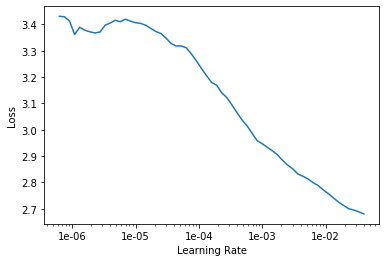

In [22]:
learn.recorder.plot()

### 1a

In [23]:
lr = 3e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.1a', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,1.758411,1.069499,0.369687,0.321761,0.378051,22.699783,0.685246,10:10


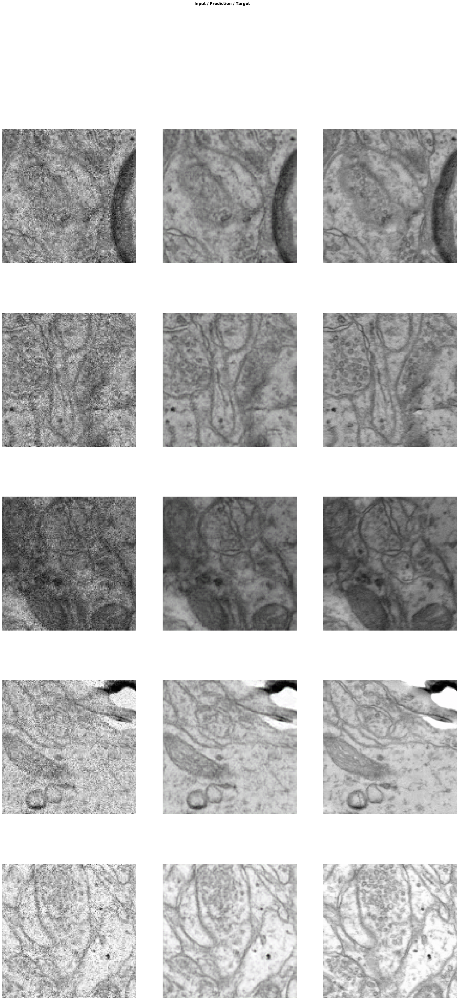

In [24]:
learn.show_results(rows=5, figsize=(30,60))

In [25]:
len(learn.data.valid_dl)

313

### 1b

In [16]:
learn.unfreeze()

In [17]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


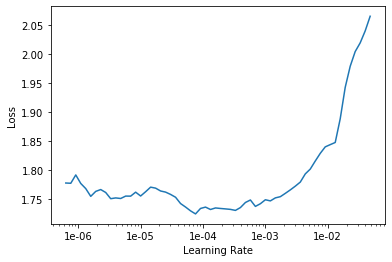

In [18]:
learn.recorder.plot()

In [19]:
lr = slice(1e-6, 1e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.1b', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,1.773520,1.063279,0.372809,0.313137,0.377333,22.663200,0.685739,10:22
1,1.744591,1.054408,0.366353,0.313829,0.374226,22.739155,0.687872,10:32
2,1.739404,1.051277,0.369030,0.307725,0.374523,22.707525,0.687668,10:10


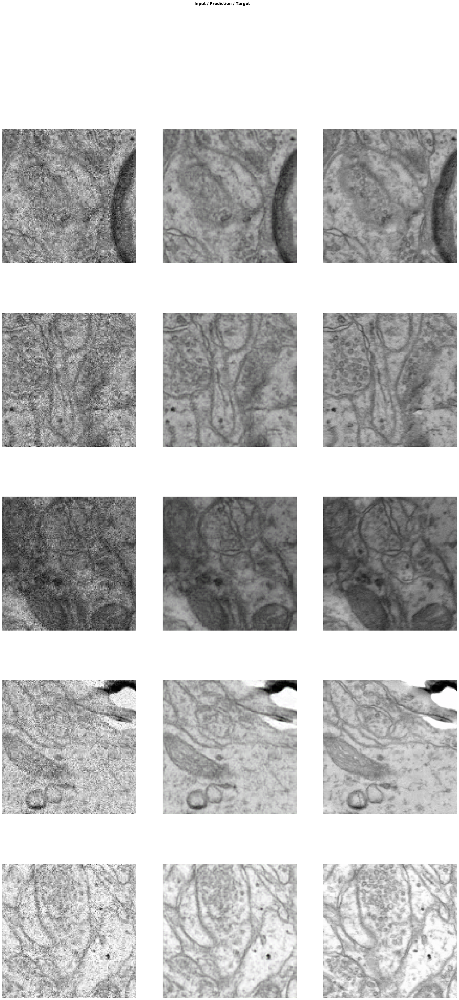

In [24]:
learn.show_results(rows=5, figsize=(30, 60))

## 2a

In [14]:
# Progressive Resizing
bs_2 = 32
size_2 = 256
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_2, in_sz=size_2, out_sz=size_2, max_zoom=3)

In [27]:
learn.data = db

In [19]:
learn.freeze()

In [20]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


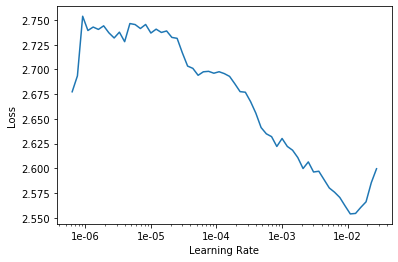

In [21]:
learn.recorder.plot()

In [22]:
lr = 2e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.2a', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,2.131404,1.571496,0.473798,0.410205,0.687494,21.623936,0.503001,36:33


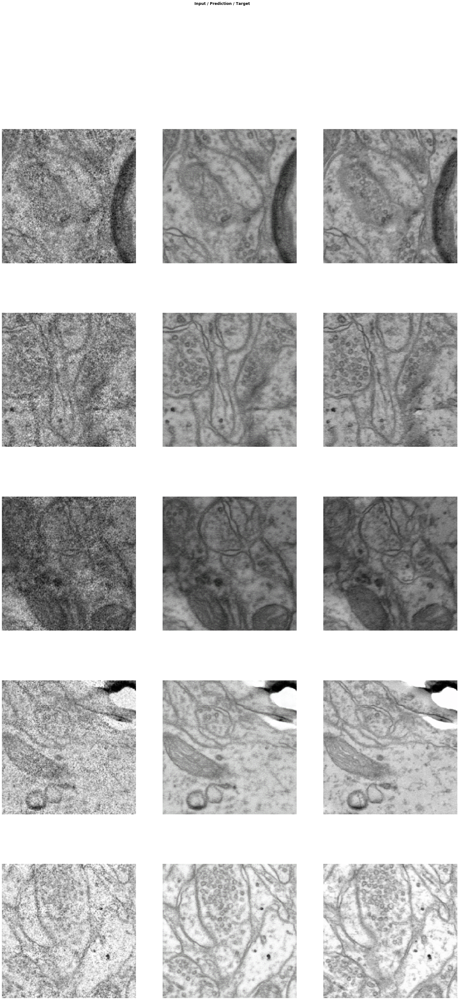

In [23]:
learn.show_results(rows=5, figsize=(30, 60))

## 2b

In [24]:
learn.unfreeze()

In [25]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


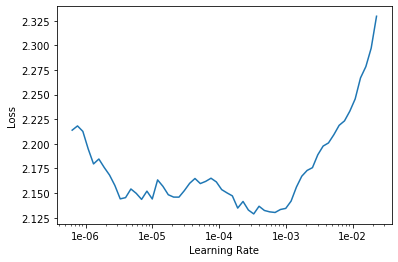

In [26]:
learn.recorder.plot()

In [27]:
lr = slice(5e-5, 5e-4)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.2b', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,2.179550,1.582909,0.477238,0.418948,0.686723,21.592588,0.503390,30:37
1,2.101669,1.567909,0.460248,0.425473,0.682188,21.750118,0.505680,32:09
2,2.087114,1.547608,0.468291,0.400841,0.678476,21.674856,0.507558,29:55


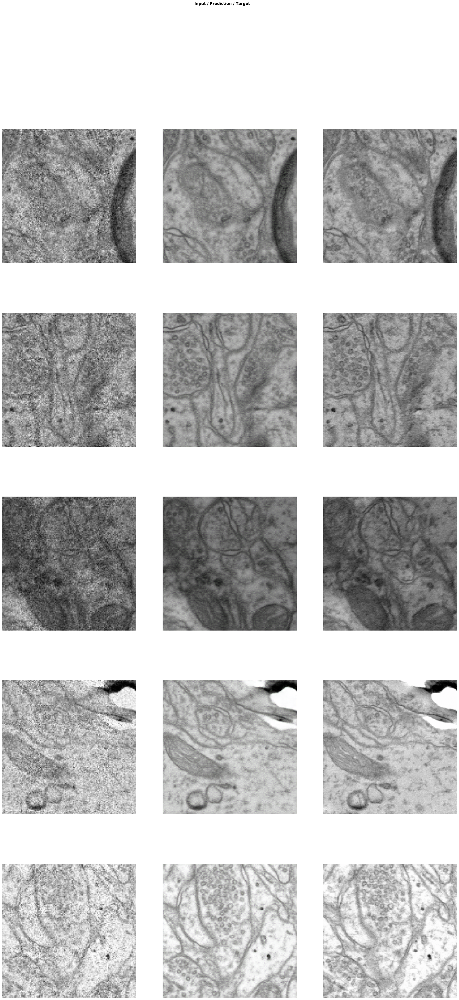

In [28]:
learn.show_results(rows=5, figsize=(30, 60))

## 3a

In [13]:
# loading 3 rounds of data
bs_3 = 8
size_3 = 512
db = get_data(data_pth=data_pth, lr_dir=lr_path, hr_dir=hr_path,
             bs=bs_3, in_sz=size_3, out_sz=size_3, max_zoom=2.)

In [30]:
learn.data = db
learn.data

ImageDataBunch;

Train: LabelList (79998 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Valid: LabelList (19999 items)
x: ImageImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: ImageList
Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/alaa/Dropbox/BPHO Staff/USF/EM/training/trainsets/lr;

Test: None

In [31]:
learn.freeze()

In [32]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


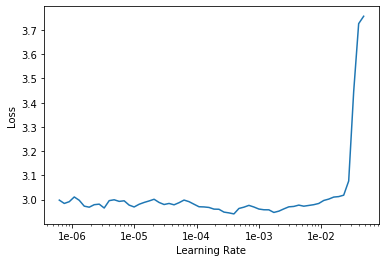

In [33]:
learn.recorder.plot()

In [34]:
lr = 5e-4
learn.fit_one_cycle(1, max_lr=lr)
learn.save(f'{nb_name}.3a', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,2.719549,2.407099,0.617375,0.584300,1.205425,20.395130,0.300702,2:06:46


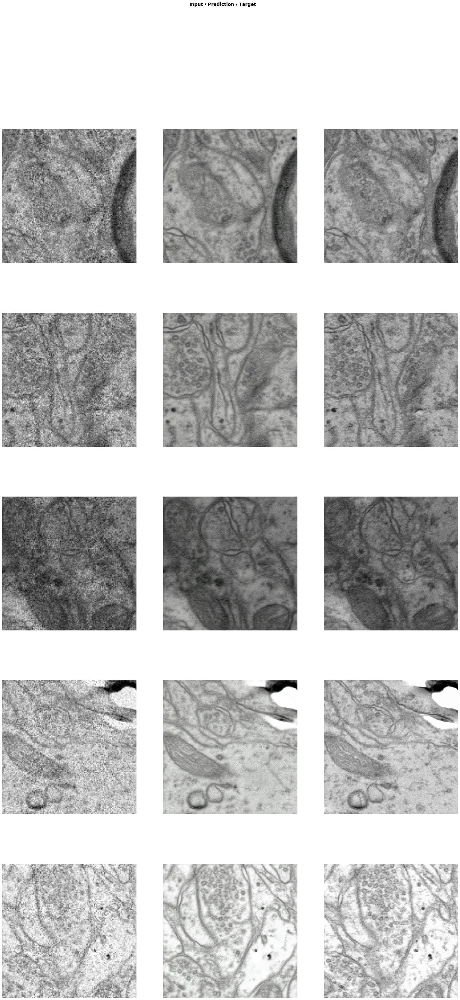

In [35]:
learn.show_results(rows=5, figsize=(25, int(25*2)))

In [17]:
learn.unfreeze()

In [ ]:
learn.lr_find()

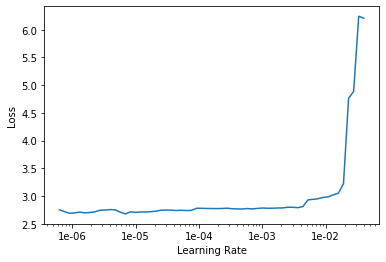

In [38]:
learn.recorder.plot()

In [20]:
learn.unfreeze()

In [21]:
lr = slice(3e-5, 3e-4, 3e-6)
learn.fit_one_cycle(3, max_lr=lr)
learn.save(f'{nb_name}.3b', with_opt=False)

epoch,train_loss,valid_loss,mse_metric,feat_loss,ssim_log_loss,psnr,ssim,time
0,2.775887,2.434745,0.636254,0.596559,1.201931,20.263052,0.301734,2:11:53
1,2.703548,2.441419,0.604055,0.629020,1.208345,20.489454,0.299830,2:11:50
2,2.714015,2.383288,0.610210,0.576576,1.196502,20.445656,0.303379,2:11:50


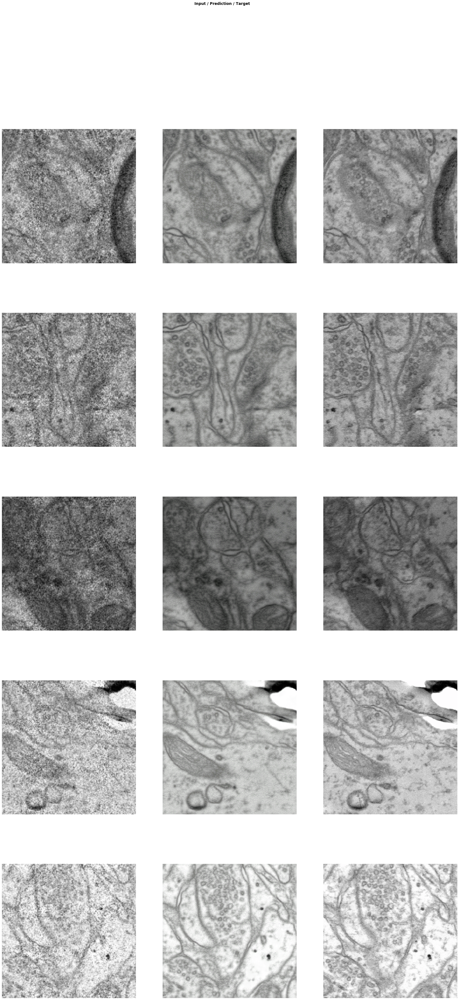

In [22]:
learn.show_results(rows=5, figsize=(30, 60))